In [76]:
import geopandas as gp
import pandas as pd
import folium
import datetime

In [7]:
df = pd.read_csv("Wildland_Fire_Incident_Locations.csv")

/var/folders/dx/sc89948n7r9d_y3ms23yc8c40000gn/T/ipykernel_97208/1734720274.py:1: DtypeWarning: Columns (7,8,17,35,64,67,88,89,93,94) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("Wildland_Fire_Incident_Locations.csv")


The description of the dataset may be 

In [8]:
columns = list(df.columns)
redcols = []
for i in columns:
    m = df[i].isna().sum()
    print(i, '                ', m)
    if m >0.5*df.shape[0]:
        redcols.append(i)


X                  0
Y                  0
OBJECTID                  0
SourceOID                  0
ABCDMisc                  237386
ADSPermissionState                  0
CalculatedAcres                  245041
ContainmentDateTime                  98989
ControlDateTime                  113776
CreatedBySystem                  0
IncidentSize                  75762
DiscoveryAcres                  64508
DispatchCenterID                  37378
EstimatedCostToDate                  235668
FinalAcres                  232228
FinalFireReportApprovedByTitle                  250391
FinalFireReportApprovedByUnit                  247775
FinalFireReportApprovedDate                  217087
FireBehaviorGeneral                  234747
FireBehaviorGeneral1                  243220
FireBehaviorGeneral2                  244393
FireBehaviorGeneral3                  246534
FireCause                  30649
FireCauseGeneral                  196147
FireCauseSpecific                  235689
FireCode               

In [9]:
df.drop(columns = redcols, inplace=True)
df.columns

Index(['X', 'Y', 'OBJECTID', 'SourceOID', 'ADSPermissionState',
       'ContainmentDateTime', 'ControlDateTime', 'CreatedBySystem',
       'IncidentSize', 'DiscoveryAcres', 'DispatchCenterID', 'FireCause',
       'FireCode', 'FireDiscoveryDateTime', 'FireOutDateTime', 'GACC',
       'IncidentName', 'IncidentTypeCategory', 'IncidentTypeKind',
       'InitialLatitude', 'InitialLongitude', 'IrwinID', 'IsFireCodeRequested',
       'IsFSAssisted', 'IsMultiJurisdictional', 'IsReimbursable', 'IsTrespass',
       'LocalIncidentIdentifier', 'POOCounty', 'POODispatchCenterID',
       'POOFips', 'POOJurisdictionalUnit', 'POOLandownerCategory',
       'POOLandownerKind', 'POOPredictiveServiceAreaID', 'POOProtectingAgency',
       'POOProtectingUnit', 'POOState', 'UniqueFireIdentifier',
       'WFDSSDecisionStatus', 'CreatedOnDateTime_dt', 'ModifiedOnDateTime_dt',
       'IsCpxChild', 'SourceGlobalID', 'GlobalID'],
      dtype='object')

<AxesSubplot: >

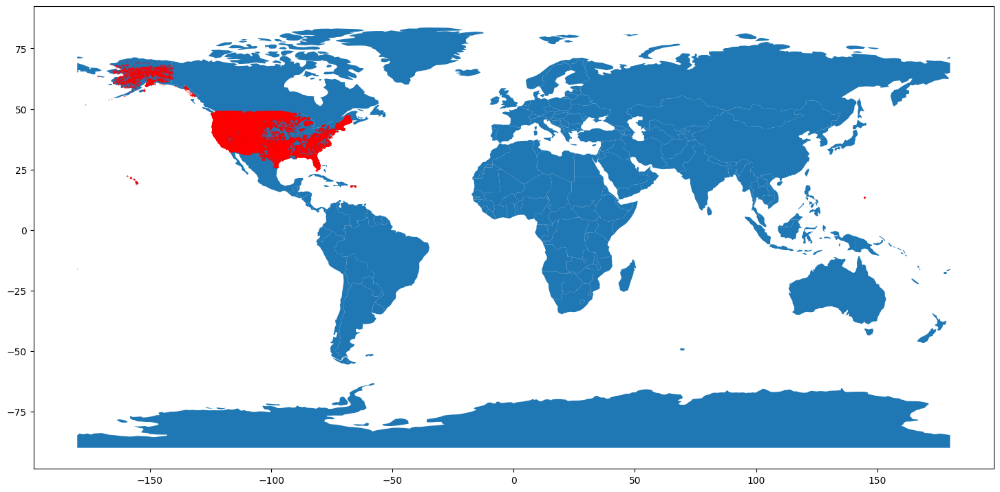

In [13]:
from shapely.geometry import Point
geometry = [Point(xy) for xy in zip(df['X'], df['Y'])]
gdf = gp.GeoDataFrame(df, geometry=geometry)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(18, 12)), marker='o', color='red', markersize=.05)

In [12]:
df.IncidentSize

0           NaN
1           NaN
2           NaN
3           NaN
4           NaN
          ...  
250386    20.00
250387     0.76
250388    42.70
250389     1.00
250390    20.00
Name: IncidentSize, Length: 250391, dtype: float64

In [81]:
df_TX = df[df.POOState == 'US-TX']
#df_TX = df_TX[df_TX['FireDiscoveryDateTime']]
df_CA = df[df.POOState == 'US-CA']
df_CO = df[df.POOState == 'US-CO']


map = folium.Map(location=[30.622370, -96.325851], zoom_start=10, control_scale=True)
feature_group = folium.FeatureGroup("Locations")
for lat, lng, ID in zip(df_TX['Y'], df_TX['X'], df_TX['OBJECTID']):
    feature_group.add_child(folium.CircleMarker(location=[lat,lng],popup=ID, radius = .2, color = '#e25822' ))

map.add_child(feature_group)
map

In [39]:
df_TX.FireDiscoveryDateTime = pd.to_datetime(df_TX.FireDiscoveryDateTime)


/var/folders/dx/sc89948n7r9d_y3ms23yc8c40000gn/T/ipykernel_97208/2983814213.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_TX.FireDiscoveryDateTime = pd.to_datetime(df_TX.FireDiscoveryDateTime)


In [41]:
df_TX.sort_values(by='FireDiscoveryDateTime', axis = 0, inplace = True)

/var/folders/dx/sc89948n7r9d_y3ms23yc8c40000gn/T/ipykernel_97208/4175023194.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_TX.sort_values(by='FireDiscoveryDateTime', axis = 0, inplace = True)


In [75]:
df_TX.FireDiscoveryDateTime[11]

Timestamp('2021-01-28 21:37:24+0000', tz='UTC')

In [69]:
df_TX.FireDiscoveryDateTime

Index(['X', 'Y', 'OBJECTID', 'SourceOID', 'ADSPermissionState',
       'ContainmentDateTime', 'ControlDateTime', 'CreatedBySystem',
       'IncidentSize', 'DiscoveryAcres', 'DispatchCenterID', 'FireCause',
       'FireCode', 'FireDiscoveryDateTime', 'FireOutDateTime', 'GACC',
       'IncidentName', 'IncidentTypeCategory', 'IncidentTypeKind',
       'InitialLatitude', 'InitialLongitude', 'IrwinID', 'IsFireCodeRequested',
       'IsFSAssisted', 'IsMultiJurisdictional', 'IsReimbursable', 'IsTrespass',
       'LocalIncidentIdentifier', 'POOCounty', 'POODispatchCenterID',
       'POOFips', 'POOJurisdictionalUnit', 'POOLandownerCategory',
       'POOLandownerKind', 'POOPredictiveServiceAreaID', 'POOProtectingAgency',
       'POOProtectingUnit', 'POOState', 'UniqueFireIdentifier',
       'WFDSSDecisionStatus', 'CreatedOnDateTime_dt', 'ModifiedOnDateTime_dt',
       'IsCpxChild', 'SourceGlobalID', 'GlobalID', 'geometry'],
      dtype='object')